## Text2FX demo

In [1]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
from audiotools import AudioSignal #for playback

import text2fx
from text2fx.apply import main as apply 
from text2fx.applybatch import main as applybatch
from text2fx.process_file_from_params import apply_fx_to_sig

## Usage

### Running Text2FX for a Single (Audio File, Target Text Descriptor) Pair

Use the `apply()` function to process an input audio file with a target text descriptor and optimize effects parameters accordingly.

#### **Inputs**
- **`audio_path`** *(str | Path | AudioSignal)*:  Path to the input audio file or an `AudioSignal` object.  
- **`fx_chain`** *(List[str])*: A list of effect names (e.g., `["reverb", "distortion"]`) defining the FX processing chain.  
- **`text_target`** *(str)*: A textual descriptor of the desired audio transformation (e.g., `"warm and deep reverb"`).  
- **`export_dir`** *(str, optional)*:  Directory where output files (`.wav` and `.json`) should be saved. Default is `None`.  
- **`learning_rate`** *(float, optional)*:  Learning rate for optimizing FX parameters. Default is `0.01`.  
- **`params_init_type`** *(str, optional)*:  Initialization type for FX parameters (e.g.,`'random'`, `'zeros'`). Default is `'random'`.  
- **`roll_amt`** *(int, optional)*: Amount by which to shift/roll the audio samples at each iteration. Default is `None`.  
- **`n_iters`** *(int, optional)*: Number of optimization iterations. Default is `600`.  
- **`criterion`** *(str, optional)*: Loss function used for optimization. Default is `'cosine-sim'`.  
- **`model`** *(str, optional)*: Model used for feature extraction. Default is `'ms_clap'`.  
- **`detailed_log`** *(bool, optional)*: Whether to log FX parameters every 100 iterations. Default is `False`.  

#### **Returns**  
The function outputs:  
- **`output_audio`** *(AudioSignal)*: The optimized, transformed audio signal with optimized FX parameters applied.  
- **`optimized_FXparams`** *(torch.Tensor)*: A tensor containing the optimized FX parameters for a given FX chain.  
- **`optimized_FXparams_dict`** *(dict)*: A dictionary of FX parameters for each FX in the FX chain, rescaled to match appropriate ranges for each FX.  

In [2]:
apply?

Signature:
apply(
    audio_path: Union[str, pathlib.Path, audiotools.core.audio_signal.AudioSignal],
    fx_chain: List[str],
    text_target: str,
    export_dir: str = None,
    learning_rate: float = 0.01,
    params_init_type: str = 'random',
    roll_amt: Optional[int] = None,
    n_iters: int = 600,
    criterion: str = 'cosine-sim',
    model: str = 'ms_clap',
    detailed_log: bool = False,
) -> Tuple[audiotools.core.audio_signal.AudioSignal, torch.Tensor, dict]
Docstring: <no docstring>
File:      ~/research/text2fx/text2fx/apply.py
Type:      function

/home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav



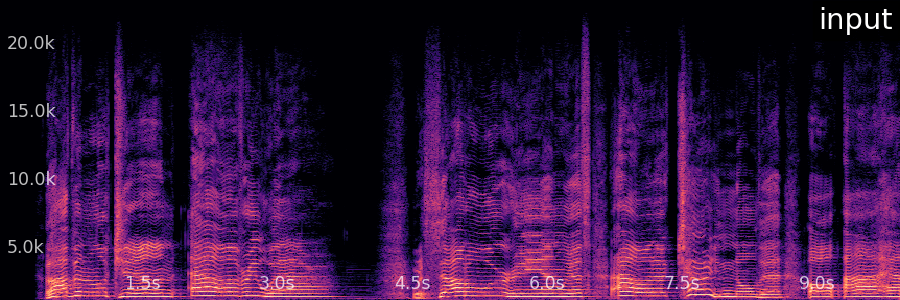
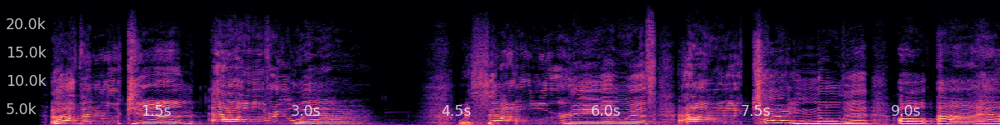

text2fx on full sig
1. processing input ... /home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav
2. created channel from ['eq', 'reverb'] ... [<dasp_pytorch.modules.ParametricEQ object at 0x7f7274ca51f0>, <dasp_pytorch.modules.NoiseShapedReverb object at 0x7f7274ca5340>]
3. applying text2fx ..., target muffled


step: 10/10,



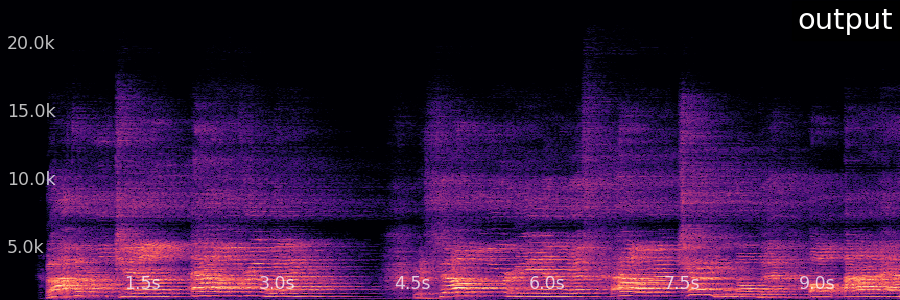
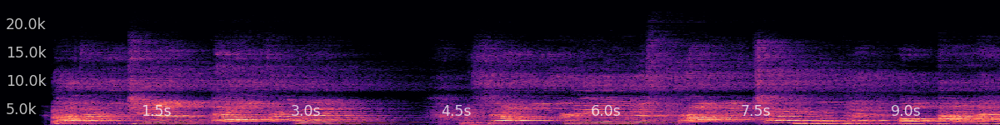

In [3]:
# Loading a sample file
EXAMPLES_DIR = Path('/home/annie/research/text2fx/assets/multistem_examples/10s')
audio_path = text2fx.core.load_examples(EXAMPLES_DIR)[0]
AudioSignal(audio_path).widget('input') #play audio file

# Text2FX it!
out_sig, out_params, out_params_dict = apply(audio_path, 
      ['eq', 'reverb'], 
      "muffled", 
      n_iters=10,
      detailed_log=False, #toggle True if you want to export optimized FXparams + audio every 100 iters
          )

# Play output sig (optimized FXparams applied to input audio file)
out_sig.widget('output')

### To simply apply Text2FX-returned optimized FXparams to any audio source, use apply_fx_to_sig()
- For example, if you run Text2FX and want to use the returned JSON from one optimization to another file. 

In [4]:
apply_fx_to_sig?

Signature:
apply_fx_to_sig(
    audio_source: Union[audiotools.core.audio_signal.AudioSignal, str, pathlib.Path, List[str], List[pathlib.Path]],
    params_dict: Union[str, pathlib.Path, Dict[str, Dict[str, float]]],
    export_path: Optional[str] = None,
)
Docstring:
Applies effects to an audio signal based on parameters provided.

Parameters:
- audio_source: An AudioSignal, file path, directory, or list of audio file paths.
- params_dict: A dictionary containing effect parameters or a path to a JSON file.
- export_path (optional): The path where the processed audio will be saved.

Assumes param_dict is formatted like:
    {
        'Effect1': {'param1': value1, 'param2': value2, ...},
        'Effect2': {'param1': value3, 'param2': value4, ...},
        ...
    }
File:      ~/research/text2fx/text2fx/process_file_from_params.py
Type:      function

/home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav is a file
[<dasp_pytorch.modules.ParametricEQ object at 0x7f713a893f10>, <dasp_pytorch.modules.NoiseShapedReverb object at 0x7f7133466190>]



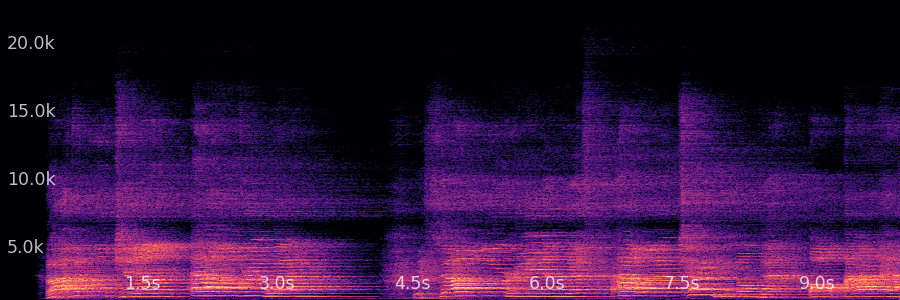
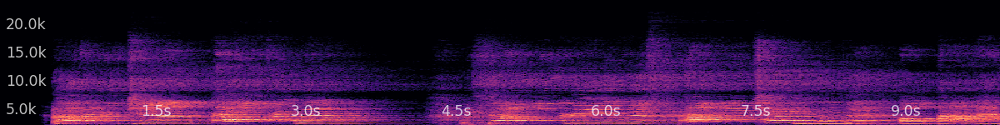

duration: 10.000 seconds
batch_size: 1
path: /home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav
sample_rate: 44100
num_channels: 2
audio_data.shape: torch.Size([1, 2, 441000])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu
 is AudioSignal
[<dasp_pytorch.modules.ParametricEQ object at 0x7f713ab02520>, <dasp_pytorch.modules.NoiseShapedReverb object at 0x7f713a898c40>]



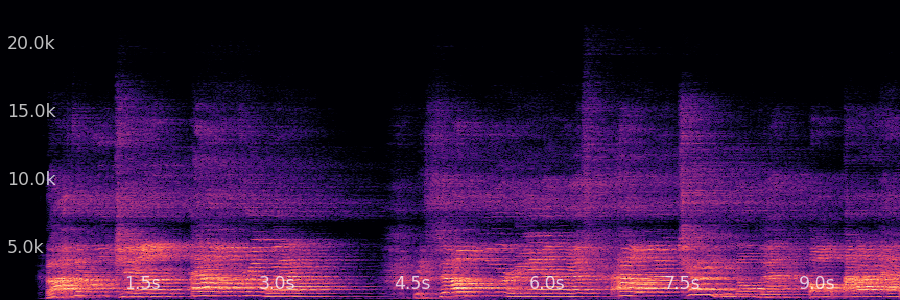
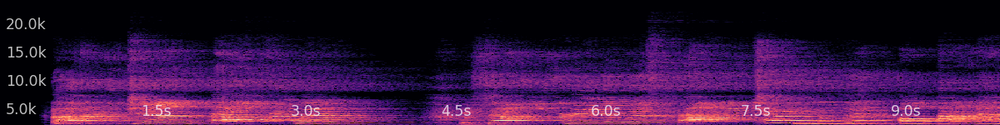

In [5]:
# Reapplying FXparams w/ out_params_dict to audio path
out = apply_fx_to_sig(audio_path, out_params_dict)
out.cpu().widget()

# Reapplying FXparams w/ out_params_dict to AudioSignal
out1 = apply_fx_to_sig(AudioSignal(audio_path), out_params_dict)
out1.cpu().widget()

# Can also reapply from a JSON dict of parameters if you exported_dir in apply() or applybatch()
# path_to_fx_dict = 'ENTER JSON PATH HERE' 
# out2 = apply_fx_to_sig(audio_path, path_to_fx_dict)

### Plotting Freq Responses via text2fx.core_plotting

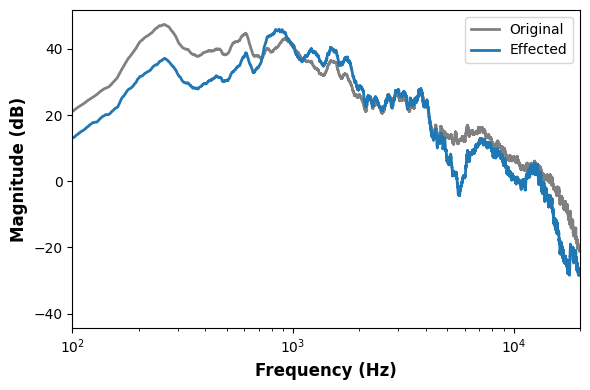

In [29]:
#visualizing detailed_log = False, just in_sig and final_sig
from text2fx.core_plotting import plot_response
plot_response(AudioSignal(audio_path), out)

If you set detailed_log = True, you can also plot all the iters

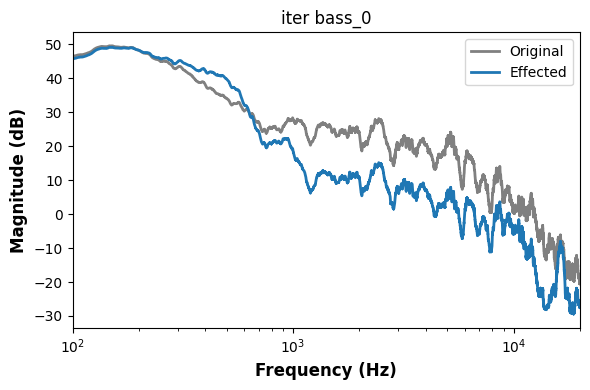

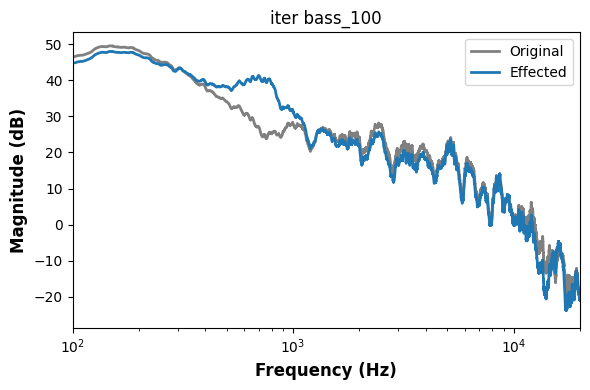

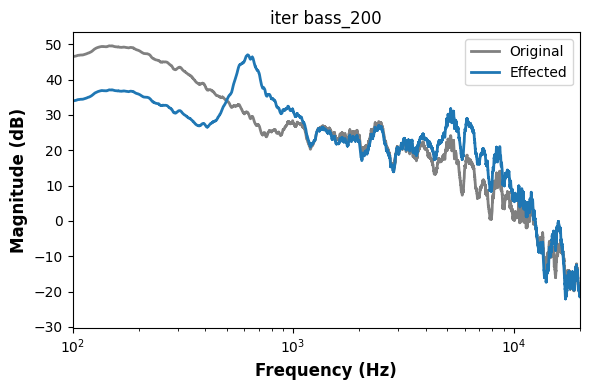

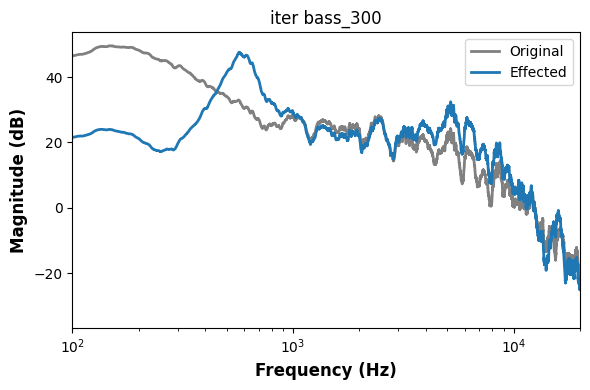

In [34]:
#visualizing detailed_log = True --  in_sig, every 100_iters, final_sig
from text2fx.core_plotting import plot_all_iters
plot_all_iters('/home/annie/research/text2fx/experiments/2025-02-18/prod_detailedlog2/2025-02-18/tinny-004/detailed_logs')

### For any multi-batch cases, use applybatch()

In [13]:
applybatch?

Signature:
applybatch(
    audio_source: Union[str, pathlib.Path],
    descriptions_source: Union[str, List[str]],
    fx_chain: List[str],
    export_dir: Union[str, pathlib.Path] = None,
    learning_rate: float = 0.001,
    params_init_type: str = 'random',
    roll_amt: Optional[int] = None,
    n_iters: int = 600,
    criterion: str = 'cosine-sim',
    model: str = 'ms_clap',
) -> Tuple[audiotools.core.audio_signal.AudioSignal, torch.Tensor, dict]
Docstring: <no docstring>
File:      ~/research/text2fx/text2fx/applybatch.py
Type:      function

In [20]:
#### 1 audio_file, n text_targets
# description_source as List[str] or str of words
applybatch(
    audio_path,
    ['warm', 'cold', 'like a worm'],
    fx_chain = ['eq'],
    n_iters=50)
# description_source as str / path to words.txt

audio source paths: [PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav')], descriptor: ['warm', 'cold', 'like a worm']


step: 50/50,


(<audiotools.core.audio_signal.AudioSignal at 0x7f7170fad430>,
 tensor([[ 1.2952, -0.0092,  0.5185,  1.0395, -0.7178, -1.9937,  0.0277, -1.1132,
          -0.6431,  1.4610, -0.9698,  0.9766, -0.4686,  0.8927,  0.1766, -0.2237,
          -0.0461,  1.1950],
         [ 1.0750,  0.8581,  1.8699, -0.7119,  0.4091,  0.7678, -0.4212,  0.2355,
          -0.2440,  0.9898, -0.4400, -0.2180,  1.0899, -0.0748, -0.7077, -0.3147,
           1.7881,  0.3270],
         [ 0.5318,  2.0252,  0.9143,  0.5508,  0.0918,  0.9551,  0.3794, -0.6836,
          -0.8037, -0.9509, -1.7708, -0.1858,  1.3243,  1.2685, -0.3037,  0.4294,
          -0.7494,  0.9180]]),
 {'ParametricEQ': {'low_shelf_gain_db': tensor([11.4014,  9.8216,  5.1965]),
   'low_shelf_cutoff_freq': tensor([1005.4370, 1410.4998, 1769.1699]),
   'low_shelf_q_factor': tensor([3.7981, 5.2120, 4.3119]),
   'band0_gain_db': tensor([ 9.5504, -6.8331,  5.3728]),
   'band0_cutoff_freq': tensor([ 709.5247, 1233.6730, 1084.0212]),
   'band0_q_factor': tens

In [25]:
#### a directory of n files, 1 text_target
# text2fx.core.load_examples(EXAMPLES_DIR)[:3]
applybatch(
    EXAMPLES_DIR,
    ['muffled under a blanket',],
    fx_chain = ['eq', 'reverb'],
    n_iters=50)

audio source paths: [PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/drums.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/guitar.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/piano.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/bass.wav')], descriptor: ['muffled under a blanket']


step: 50/50,


(<audiotools.core.audio_signal.AudioSignal at 0x7f7276f65160>,
 tensor([[ 0.1995, -0.2526,  0.1738,  0.9440,  1.5933,  0.1778, -0.4103,  1.1880,
           0.7267, -0.0462,  0.8419, -0.6221,  1.0804,  1.7749,  1.0195, -0.0801,
           0.1337,  0.2467, -0.3715, -0.3611,  0.0565,  0.4301, -1.0355,  1.5519,
           0.2024,  0.0704, -2.4663,  0.6035, -1.0087,  0.1372,  0.4602, -0.1414,
           1.2797, -0.2368, -0.5367,  1.5289, -1.4331, -1.1689, -3.0239, -0.8053,
           0.1007, -1.6576, -0.5112],
         [ 0.2100, -0.1670,  0.4536,  1.1160, -0.8164, -0.0884,  0.0707,  0.8079,
           2.2038, -0.0137, -0.1308, -1.0310,  0.7606, -0.1209,  2.2736, -0.6236,
          -1.6545,  0.6022,  0.9596,  1.1455,  1.8616, -0.2602,  0.0528,  2.9557,
           0.8201,  0.9623, -0.0146, -0.5960,  0.6587, -0.7214,  0.4195, -0.4366,
           0.9982,  0.1382, -0.7521, -2.0733, -0.5129, -1.3977, -1.4222,  0.1052,
           1.1069,  0.1715,  0.0971],
         [ 0.5672, -0.8800,  0.4966,  1.8

In [27]:
#### n audio_files, n_text_targets
# description_source as List[str] or str of words
applybatch(
    EXAMPLES_DIR,
    ['muffled under a blanket', 'warm', 'shiny', 'bright like a horn', 'thin and hollow'],
    fx_chain = ['eq'],
    n_iters=50)
# description_source as str / path to words.txt

audio source paths: [PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/vocals.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/drums.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/guitar.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/piano.wav'), PosixPath('/home/annie/research/text2fx/assets/multistem_examples/10s/bass.wav')], descriptor: ['muffled under a blanket', 'warm', 'shiny', 'bright like a horn', 'thin and hollow']


step: 50/50,


(<audiotools.core.audio_signal.AudioSignal at 0x7f71711397c0>,
 tensor([[ 6.3089e-01,  6.3717e-01,  3.7078e-01, -2.3587e+00,  7.9587e-01,
           1.9974e-01,  5.1317e-01, -1.1267e-01, -1.0166e+00,  8.9957e-01,
          -7.4628e-01,  9.3733e-01,  5.8275e-01, -2.5738e-01,  1.0848e+00,
          -1.4731e+00,  1.3132e-02,  9.0085e-01],
         [-1.5403e-01, -5.5804e-01,  2.9901e-01, -7.2346e-01,  4.2788e-01,
           5.4744e-01, -4.4097e-01, -1.4351e+00,  9.0372e-01,  1.0420e+00,
           8.3734e-01, -6.8496e-01,  2.1912e+00,  8.4953e-01,  1.1718e+00,
          -5.3117e-02, -6.6934e-01, -3.4062e-01],
         [ 1.1435e+00,  2.1160e-01, -1.4127e+00, -1.8583e+00,  1.3514e+00,
           9.5123e-01, -3.4818e-01, -8.5207e-01, -9.7190e-01,  7.9074e-01,
          -1.6360e-01, -3.1337e-01, -8.6835e-01, -4.1632e-01, -1.4344e+00,
           6.3378e-02,  3.4191e-01, -3.3421e-01],
         [ 4.2937e-01, -1.2099e+00,  1.7470e+00,  1.0335e+00,  1.2632e+00,
           2.0017e-01, -1.0417e+00, -